In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

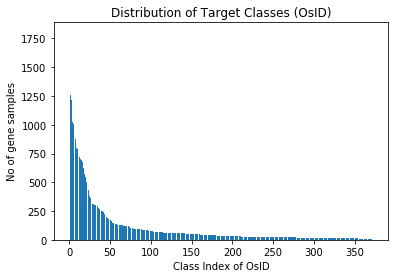

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=80, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1
Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/80
1834/1834 [==============================] - 7s 3ms/step - loss: 4.4495 - accuracy: 0.1017 - val_loss: 4.0926 - val_accuracy: 0.1191
Epoch 2/80
1834/1834 [==============================] - 5s 3ms/step - loss: 3.7373 - accuracy: 0.1635 - val_loss: 3.7273 - val_accuracy: 0.2405
Epoch 3/80
1834/1834 [==============================] - 5s 3ms/step - loss: 3.3546 - accuracy: 0.2449 - val_loss: 3.3811 - val_accuracy: 0.2795
Epoch 4/80
1834/1834 [==============================] - 5s 2ms/step - loss: 3.0534 - accuracy: 0.2867 - val_loss: 3.1501 - val_accuracy: 0.2890
Epoch 5/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.8320 - accuracy: 0.3292 - val_loss: 2.9856 - val_accuracy: 0.3350
Epoch 6/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.6643 - accuracy: 0.3611 - val_loss: 2.8324 - val_accuracy: 0.3970
Epoch 7/80
1834/1834 [==============================] - 4s 2ms/step - loss: 2.5397 - accuracy: 0.3843 - val_loss: 2.7872 - val_accuracy:

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 4.1733 - accuracy: 0.1814 - val_loss: 3.5303 - val_accuracy: 0.3155
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 2.8410 - accuracy: 0.4163 - val_loss: 2.7483 - val_accuracy: 0.4938
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 2.1900 - accuracy: 0.5305 - val_loss: 2.3116 - val_accuracy: 0.5374
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7892 - accuracy: 0.5877 - val_loss: 1.9872 - val_accuracy: 0.5910
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5395 - accuracy: 0.6253 - val_loss: 1.8316 - val_accuracy: 0.6304
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3833 - accuracy: 0.6457 - val_loss: 1.6915 - val_accuracy: 0.6349
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.2804 - accuracy: 0.6601 - val_loss: 1.6086 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.8424 - accuracy: 0.2578 - val_loss: 2.9671 - val_accuracy: 0.4172
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 2.2495 - accuracy: 0.5584 - val_loss: 2.0940 - val_accuracy: 0.6231
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5494 - accuracy: 0.6678 - val_loss: 1.6367 - val_accuracy: 0.6672
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1804 - accuracy: 0.7213 - val_loss: 1.3830 - val_accuracy: 0.7265
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9805 - accuracy: 0.7565 - val_loss: 1.2199 - val_accuracy: 0.7744
Epoch 6/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8659 - accuracy: 0.7759 - val_loss: 1.1686 - val_accuracy: 0.7655
Epoch 7/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7914 - accuracy: 0.7924 - val_loss: 1.0451 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 13s 4ms/step - loss: 3.6716 - accuracy: 0.3149 - val_loss: 2.6767 - val_accuracy: 0.5027
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.9450 - accuracy: 0.6113 - val_loss: 1.7924 - val_accuracy: 0.6444
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.2732 - accuracy: 0.7210 - val_loss: 1.4031 - val_accuracy: 0.7217
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9320 - accuracy: 0.7852 - val_loss: 1.1161 - val_accuracy: 0.7812
Epoch 5/80
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7356 - accuracy: 0.8214 - val_loss: 0.9788 - val_accuracy: 0.7925
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6263 - accuracy: 0.8417 - val_loss: 0.9583 - val_accuracy: 0.8031
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5534 - accuracy: 0.8585 - val_loss: 0.7673 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 13s 4ms/step - loss: 3.7212 - accuracy: 0.3090 - val_loss: 2.6926 - val_accuracy: 0.5443
Epoch 2/80
1834/1834 [==============================] - 5s 3ms/step - loss: 1.8203 - accuracy: 0.6710 - val_loss: 1.5603 - val_accuracy: 0.7332
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.0273 - accuracy: 0.8039 - val_loss: 1.1215 - val_accuracy: 0.8105
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6977 - accuracy: 0.8510 - val_loss: 0.8356 - val_accuracy: 0.8572
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5358 - accuracy: 0.8768 - val_loss: 0.6944 - val_accuracy: 0.8682
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4571 - accuracy: 0.8884 - val_loss: 0.6296 - val_accuracy: 0.8815
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4024 - accuracy: 0.8994 - val_loss: 0.5837 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.8039 - accuracy: 0.2906 - val_loss: 2.7413 - val_accuracy: 0.4821
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.8626 - accuracy: 0.6612 - val_loss: 1.6244 - val_accuracy: 0.7157
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.0849 - accuracy: 0.7759 - val_loss: 1.1418 - val_accuracy: 0.7943
Epoch 4/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.7210 - accuracy: 0.8392 - val_loss: 0.8743 - val_accuracy: 0.8375
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5460 - accuracy: 0.8704 - val_loss: 0.7389 - val_accuracy: 0.8729
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4468 - accuracy: 0.8915 - val_loss: 0.6755 - val_accuracy: 0.8769
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3968 - accuracy: 0.9018 - val_loss: 0.5888 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4155 - accuracy: 0.3668 - val_loss: 2.3449 - val_accuracy: 0.5808
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5649 - accuracy: 0.7030 - val_loss: 1.4238 - val_accuracy: 0.7172
Epoch 3/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9142 - accuracy: 0.8039 - val_loss: 1.0003 - val_accuracy: 0.8275
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6312 - accuracy: 0.8521 - val_loss: 0.7751 - val_accuracy: 0.8583
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4918 - accuracy: 0.8790 - val_loss: 0.6748 - val_accuracy: 0.8711
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4240 - accuracy: 0.8930 - val_loss: 0.5984 - val_accuracy: 0.8979
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3776 - accuracy: 0.8990 - val_loss: 0.5573 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.3301 - accuracy: 0.4078 - val_loss: 2.1637 - val_accuracy: 0.6300
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4137 - accuracy: 0.7290 - val_loss: 1.3306 - val_accuracy: 0.7693
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8590 - accuracy: 0.8259 - val_loss: 0.9629 - val_accuracy: 0.8184
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6187 - accuracy: 0.8619 - val_loss: 0.7521 - val_accuracy: 0.8541
Epoch 5/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4892 - accuracy: 0.8851 - val_loss: 0.7081 - val_accuracy: 0.8620
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4126 - accuracy: 0.8999 - val_loss: 0.5874 - val_accuracy: 0.8829
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3684 - accuracy: 0.9075 - val_loss: 0.5284 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5651 - accuracy: 0.3532 - val_loss: 2.4377 - val_accuracy: 0.5992
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.6400 - accuracy: 0.6992 - val_loss: 1.5323 - val_accuracy: 0.7312
Epoch 3/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9859 - accuracy: 0.8064 - val_loss: 1.0909 - val_accuracy: 0.8136
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6960 - accuracy: 0.8488 - val_loss: 0.9017 - val_accuracy: 0.8415
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5433 - accuracy: 0.8712 - val_loss: 0.7305 - val_accuracy: 0.8609
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4543 - accuracy: 0.8889 - val_loss: 0.6565 - val_accuracy: 0.8740
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3952 - accuracy: 0.9028 - val_loss: 0.6435 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.6034 - accuracy: 0.3285 - val_loss: 2.4261 - val_accuracy: 0.5768
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.6064 - accuracy: 0.6977 - val_loss: 1.4538 - val_accuracy: 0.7544
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9438 - accuracy: 0.8127 - val_loss: 1.0354 - val_accuracy: 0.8233
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6511 - accuracy: 0.8560 - val_loss: 0.8087 - val_accuracy: 0.8656
Epoch 5/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5087 - accuracy: 0.8822 - val_loss: 0.6988 - val_accuracy: 0.8660
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4177 - accuracy: 0.9037 - val_loss: 0.6270 - val_accuracy: 0.8855
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3661 - accuracy: 0.9097 - val_loss: 0.5715 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 12s 5ms/step - loss: 3.4957 - accuracy: 0.3588 - val_loss: 2.4329 - val_accuracy: 0.5596
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5740 - accuracy: 0.7048 - val_loss: 1.4434 - val_accuracy: 0.7540
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8981 - accuracy: 0.8147 - val_loss: 1.0014 - val_accuracy: 0.8246
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5983 - accuracy: 0.8676 - val_loss: 0.7767 - val_accuracy: 0.8700
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4613 - accuracy: 0.8892 - val_loss: 0.6543 - val_accuracy: 0.8862
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3856 - accuracy: 0.9050 - val_loss: 0.5991 - val_accuracy: 0.9041
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3325 - accuracy: 0.9173 - val_loss: 0.5741 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.3448 - accuracy: 0.4008 - val_loss: 2.1192 - val_accuracy: 0.6249
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.3321 - accuracy: 0.7455 - val_loss: 1.1884 - val_accuracy: 0.7932
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7791 - accuracy: 0.8340 - val_loss: 0.9228 - val_accuracy: 0.8222
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5633 - accuracy: 0.8678 - val_loss: 0.7261 - val_accuracy: 0.8499
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4599 - accuracy: 0.8859 - val_loss: 0.6545 - val_accuracy: 0.8826
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3954 - accuracy: 0.9023 - val_loss: 0.5784 - val_accuracy: 0.9019
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3564 - accuracy: 0.9091 - val_loss: 0.5469 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5257 - accuracy: 0.3621 - val_loss: 2.3063 - val_accuracy: 0.5837
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4637 - accuracy: 0.7320 - val_loss: 1.3048 - val_accuracy: 0.7651
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8332 - accuracy: 0.8286 - val_loss: 0.9708 - val_accuracy: 0.8361
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5769 - accuracy: 0.8674 - val_loss: 0.7379 - val_accuracy: 0.8809
Epoch 5/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4435 - accuracy: 0.8928 - val_loss: 0.7449 - val_accuracy: 0.8711
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3851 - accuracy: 0.9053 - val_loss: 0.5883 - val_accuracy: 0.8937
Epoch 7/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3318 - accuracy: 0.9174 - val_loss: 0.5330 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5333 - accuracy: 0.3498 - val_loss: 2.4323 - val_accuracy: 0.5921
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5890 - accuracy: 0.6949 - val_loss: 1.4547 - val_accuracy: 0.7438
Epoch 3/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.9147 - accuracy: 0.8167 - val_loss: 1.0282 - val_accuracy: 0.8368
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6203 - accuracy: 0.8674 - val_loss: 0.8202 - val_accuracy: 0.8727
Epoch 5/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4699 - accuracy: 0.8915 - val_loss: 0.7072 - val_accuracy: 0.8749
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3831 - accuracy: 0.9081 - val_loss: 0.6184 - val_accuracy: 0.8908
Epoch 7/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3373 - accuracy: 0.9198 - val_loss: 0.6540 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4675 - accuracy: 0.3604 - val_loss: 2.2255 - val_accuracy: 0.6473
Epoch 2/80
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4083 - accuracy: 0.7436 - val_loss: 1.2157 - val_accuracy: 0.7894
Epoch 3/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7745 - accuracy: 0.8330 - val_loss: 0.8660 - val_accuracy: 0.8496
Epoch 4/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5429 - accuracy: 0.8736 - val_loss: 0.7490 - val_accuracy: 0.8543
Epoch 5/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4289 - accuracy: 0.8922 - val_loss: 0.6721 - val_accuracy: 0.8767
Epoch 6/80
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3647 - accuracy: 0.9098 - val_loss: 0.5808 - val_accuracy: 0.8939
Epoch 7/80
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3319 - accuracy: 0.9173 - val_loss: 0.5151 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.3720 - accuracy: 0.3846 - val_loss: 2.0808 - val_accuracy: 0.6550
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.2525 - accuracy: 0.7626 - val_loss: 1.1066 - val_accuracy: 0.8319
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6538 - accuracy: 0.8653 - val_loss: 0.8079 - val_accuracy: 0.8632
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4341 - accuracy: 0.9016 - val_loss: 0.6929 - val_accuracy: 0.8729
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3412 - accuracy: 0.9198 - val_loss: 0.5695 - val_accuracy: 0.9023
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2947 - accuracy: 0.9302 - val_loss: 0.4912 - val_accuracy: 0.9123
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2617 - accuracy: 0.9360 - val_loss: 0.4832 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.8257 - accuracy: 0.2830 - val_loss: 2.7935 - val_accuracy: 0.5113
Epoch 2/80
1834/1834 [==============================] - 8s 4ms/step - loss: 1.8947 - accuracy: 0.6596 - val_loss: 1.6096 - val_accuracy: 0.7329
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.0193 - accuracy: 0.8032 - val_loss: 1.0824 - val_accuracy: 0.8204
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6415 - accuracy: 0.8677 - val_loss: 0.8139 - val_accuracy: 0.8756
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4641 - accuracy: 0.8984 - val_loss: 0.6920 - val_accuracy: 0.8860
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3663 - accuracy: 0.9183 - val_loss: 0.6146 - val_accuracy: 0.8957
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3089 - accuracy: 0.9279 - val_loss: 0.5443 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.2590 - accuracy: 0.3851 - val_loss: 2.1433 - val_accuracy: 0.6156
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4617 - accuracy: 0.7170 - val_loss: 1.3294 - val_accuracy: 0.7666
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8896 - accuracy: 0.8153 - val_loss: 1.0295 - val_accuracy: 0.8184
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6110 - accuracy: 0.8620 - val_loss: 0.7610 - val_accuracy: 0.8658
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4403 - accuracy: 0.8951 - val_loss: 0.7727 - val_accuracy: 0.8636
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3540 - accuracy: 0.9152 - val_loss: 0.6290 - val_accuracy: 0.8988
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3024 - accuracy: 0.9264 - val_loss: 0.5633 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Epoch 1/80
1834/1834 [==============================] - 12s 5ms/step - loss: 3.2879 - accuracy: 0.3825 - val_loss: 2.0854 - val_accuracy: 0.6411
Epoch 2/80
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3545 - accuracy: 0.7494 - val_loss: 1.2492 - val_accuracy: 0.7885
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7720 - accuracy: 0.8411 - val_loss: 0.9027 - val_accuracy: 0.8492
Epoch 4/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4964 - accuracy: 0.8893 - val_loss: 0.6779 - val_accuracy: 0.8933
Epoch 5/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3599 - accuracy: 0.9145 - val_loss: 0.5917 - val_accuracy: 0.9032
Epoch 6/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3024 - accuracy: 0.9227 - val_loss: 0.5073 - val_accuracy: 0.9201
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2544 - accuracy: 0.9339 - val_loss: 0.4917 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/80
1834/1834 [==============================] - 11s 4ms/step - loss: 3.4462 - accuracy: 0.3609 - val_loss: 2.2054 - val_accuracy: 0.5868
Epoch 2/80
1834/1834 [==============================] - 6s 3ms/step - loss: 1.4259 - accuracy: 0.7313 - val_loss: 1.2413 - val_accuracy: 0.7945
Epoch 3/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7540 - accuracy: 0.8479 - val_loss: 0.8422 - val_accuracy: 0.8605
Epoch 4/80
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4703 - accuracy: 0.8957 - val_loss: 0.6099 - val_accuracy: 0.8829
Epoch 5/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3395 - accuracy: 0.9138 - val_loss: 0.5289 - val_accuracy: 0.9028
Epoch 6/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2763 - accuracy: 0.9296 - val_loss: 0.4644 - val_accuracy: 0.9221
Epoch 7/80
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2438 - accuracy: 0.9377 - val_loss: 0.4185 - val_

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

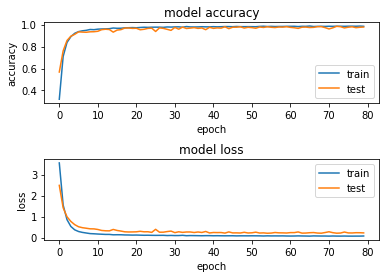

Final Test Accuracy: 0.9870273470878601


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


ValueError: in user code:

    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2137, in predict_function  *
        return step_function(self, iterator)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2123, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2111, in run_step  **
        outputs = model.predict_step(data)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2079, in predict_step
        return self(x, training=False)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\input_spec.py", line 296, in assert_input_compatibility
        f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "sequential_37" is incompatible with the layer: expected shape=(None, 19), found shape=(None, 20)


In [ ]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         328              328        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
